# Animate Eddy Trajectories

In [1]:
import h5py
import numpy as np
from scipy.io import netcdf
from matplotlib import pyplot as plt
from matplotlib import animation as anm
from IPython.display import HTML

In [2]:
fpath_eddy = '/gscratch/jisao/mclaret/GL64/Juillet/'
f = h5py.File(fpath_eddy + 'eddy_tracks.mat')

# Arrange data into a list of dictionaries
data = f['tracks']            # relevant variables
varnames = list(f['tracks'])  # variable names
ntracks = len(data['x1'])     # number of tracks (should match with length of data in 'x1')

tracks = []                   # initialize list of eddy tracks

# add dictionaries for each variable to the corresponding eddy index (0 - N-1)
for itrack in range(ntracks):
    variables = {var:[] for var in varnames}  # initialize a dictionary with each variable name
    for var in varnames:
        # go through each variable
        if var[0:6] == 'shapes':
            # translate shapes data to list of numpy arrays (one array for each time step)
            coordinates = []                             # initialize list of coordinates
            numSteps = len(f[data[var][itrack,0]][(0)])  # number of timesteps
            # each timestep has its own hdf5 object reference, so append each step to a list
            for step in range(numSteps):
                coords = np.array(f[f[data[var][itrack,0]][(0, step)]])
                coordinates.append(coords)
            variables[var] = coordinates
        else:
            # translate data from hdf5 object reference to numpy array
            variables[var] = np.array(f[data[var][itrack,0]][(0)])
    tracks.append(variables)
    
print('Number of eddies:', len(tracks))

Number of eddies: 111


In [3]:
print(tracks[0]['step'])
print(2. in tracks[0]['step'])

[  1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.  14.
  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.
  29.  30.  31.  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.  42.
  43.  44.  45.  46.  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.
  57.  58.  59.  60.  61.  62.  63.  64.  65.  66.  67.  68.  69.  70.
  71.  72.  73.  74.  75.  76.  77.  78.  79.  80.  81.  82.  83.  84.
  85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.  98.
  99. 100. 101. 108. 109. 110. 111. 112. 113. 114. 115. 116. 117. 118.
 119. 120. 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137. 146.
 147. 148. 149. 150. 151. 152. 153. 154. 155. 156. 165. 166. 167. 168.
 169. 170. 171. 172. 173. 183. 184. 185. 186. 187. 188. 189. 190. 191.
 203. 204. 205. 206. 207. 208. 223. 224. 225.]
True


In [4]:
print(tracks[5]['type'])

[-1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1.
 -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1. -1

In [5]:
# import file
fpath_temp = '/gscratch/jisao/mclaret/GL64/Juin_Novembre/'
gridT_k1 = netcdf.netcdf_file(fpath_temp + 'GLazur64-T20_y2009m06_m11_gridT_k1.nc','r')

# keep variables
lat = gridT_k1.variables['nav_lat'][:][:].copy()
lon = gridT_k1.variables['nav_lon'][:][:].copy()
land = gridT_k1.variables['votemper'][0][0][:][:].copy()
water = gridT_k1.variables['votemper'][0][0][:][:].copy()
gridT_k1.close()

In [6]:
# save eddies that live 10 days or longer and determine first/last timestep
lifetime = 240             # lifetime (in hours)
ntracks = len(tracks)      # number of eddies
tracks_10days = []         # list to hold eddies that live longer than 10 days
t0 = tracks[0]['step'][0]  # initialize variable to hold first timestep
t1 = tracks[0]['step'][0]  # initialize variable to hold last timestep

for itrack in range(ntracks):
    timesteps = tracks[itrack]['step'][-1] - tracks[itrack]['step'][0]
    if timesteps >= lifetime:
        # add to 10 days list
        tracks_10days.append(tracks[itrack])
        print(itrack, timesteps)
        
    if tracks[itrack]['step'].min() < t0:
        # change t0 to this value
        t0 = tracks[itrack]['step'].min()
        
    if tracks[itrack]['step'].max() > t1:
        # change t1 to this value
        t1 = tracks[itrack]['step'].max()
        
print('first timestep:', tracks[0]['step'][0])
print('last timestep:', tracks[-1]['step'][-1])
print('first timestep:', t0)
print('last timestep:', t1)

2 370.0
5 370.0
6 370.0
10 370.0
13 275.0
14 370.0
17 293.0
19 370.0
26 370.0
28 357.0
29 370.0
31 283.0
34 293.0
37 367.0
38 367.0
39 367.0
40 307.0
45 309.0
52 312.0
53 316.0
54 268.0
68 246.0
first timestep: 1.0
last timestep: 371.0
first timestep: 1.0
last timestep: 371.0


In [7]:
import matplotlib.patheffects as pe  # used to outline text

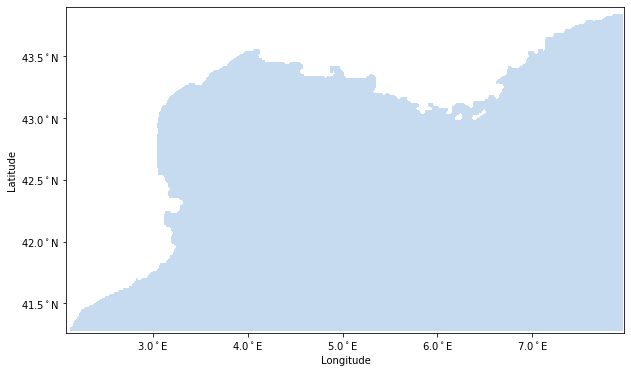

In [9]:
fig, ax = plt.subplots(figsize=(10,6))
land = np.ma.masked_where(land == 0.0, land)
water = np.logical_not(land)

# plot map
plt.contourf(lon, lat, water,cmap='Blues')

# format lat/long labels
locs, labels = plt.xticks()
Elabels = [str(loc) + '$^\circ$E' for loc in locs]
plt.xticks(locs[1:-1], Elabels[1:-1])
locs, labels = plt.yticks()
Nlabels = [str(loc) + '$^\circ$N' for loc in locs]
plt.yticks(locs[1:-1], Nlabels[1:-1])

# figure labels
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.pause(0.002)  # allow time to draw

ntracks_10days = len(tracks_10days)         # number of eddies
current_time = ax.text(2.2, 43.8, '', color='k')

def animate(i):
    # iterable function to be animated
    xs_scatter = []  # holds x of every point
    ys_scatter = []  # holds y of every point
    colors = []      # holds corresponding color
    
    # dispay timestep
    current_time.set_text('timestep: ' + str(i))
    
    for itrack in range(ntracks_10days):
        # check every track
        if tracks_10days[itrack]['step'][0] == i:
            # annotate step if first timestep
            
            # add position
            x = tracks_10days[itrack]['x1'][0]
            y = tracks_10days[itrack]['y1'][0]
            xs_scatter.append(x)
            ys_scatter.append(y)
            
            # add color
            cyclone = tracks_10days[itrack]['type'][0]
            if cyclone == -1:
                colors.append('b')
            if cyclone == 1:
                colors.append('r')
            
            # annotate with timestep
            ax.annotate(str(i), (x, y), color='k',
                       path_effects=[pe.withStroke(linewidth=3, foreground='w', alpha=0.7)])
        elif tracks_10days[itrack]['step'][-1] == i:
            # annotate step if last timestep
            
            # add position
            x = tracks_10days[itrack]['x1'][-1]
            y = tracks_10days[itrack]['y1'][-1]
            xs_scatter.append(x)
            ys_scatter.append(y)
            
            # add color
            cyclone = tracks_10days[itrack]['type'][-1]
            if cyclone == -1:
                colors.append('b')
            if cyclone == 1:
                colors.append('r')
            
            # annotate with timestep
            ax.annotate(str(i), (x, y), color='k',
                       path_effects=[pe.withStroke(linewidth=3, foreground='w', alpha=0.5)])
        elif i in tracks_10days[itrack]['step']:
            # plot without annotating
            j = np.where(tracks_10days[itrack]['step'] == i)
            
            #add position
            x = tracks_10days[itrack]['x1'][j]
            y = tracks_10days[itrack]['y1'][j]
            xs_scatter.append(x)
            ys_scatter.append(y)
            
            # add color
            cyclone = tracks_10days[itrack]['type'][0]
            if cyclone == -1:
                colors.append('b')
            if cyclone == 1:
                colors.append('r')
        
        if i == t1:
            # plot full path at the end of the animation
            line = ax.plot(tracks_10days[itrack]['x1'], tracks_10days[itrack]['y1'], color='w', alpha=0.5)
            
    ax.scatter(xs_scatter, ys_scatter, marker='o', color=colors)
    plt.pause(0.001)  # allow time to draw
    return current_time,

# frames = num of timesteps, interval = time btwn frames in ms
anim = anm.FuncAnimation(fig, animate, frames=int(t1-t0)+2, interval = 100)
HTML(anim.to_jshtml())